# COVID-19 Worldwide Vaccination Rates

SARS-CoV-2 is the virus that caused COVID-19, a respiratory disease which has spread globally since its emergence in late 2019. The spread of this virus is facilitated through contact with miniature airborne droplets and particles that enter the body and infect the host. Those infected with the virus may then spread it even further through close contact with others by acts such as sneezing or coughing. Since its origins, mutations such as Omicron and Delta have surfaced in different areas around the world with fluctuations in the number of cases (What Is Coronavirus?, 2022).

Several vaccines aimed to prevent the transmission and spread of COVID-19 have been developed. Pfizer-BioNTech, Moderna, and Johnson & Johnson are few of the most commonly distributed vaccines globally. Pfizer and Moderna utilize a technology involving messenger Ribonucleic Acid (mRNA), where cells in the body are given a set of instructions on constructing a protein found in the virus. Thereafter, antibodies are created to combat the S proteins, and the mRNA breaks down afterwards (COVID-19 vaccines, 2022).

In this project, I have utilized a dataset from Kaggle with the information gathered from the organization, Our World in Data. The datasets feature vaccination rates, types, and the amount administered globally and by country. It also gives insights on the vaccination status of each country over time, including those fully and partially vaccinated. The data is limited to late December 2020 to early March 2022. This project will answer questions including, but not limited to:

What is the total number of people who are fully vaccinated, worldwide? What is the percentage of people that are vaccinated by country? Which countries have the highest fully vaccinated rates (2 doses for Pfizer/Moderna, 1 for Johnson & Johnson)? Which countries have the least? Which vaccine type is most commonly used in various countries? What are the distributions between those fully versus those partially vaccinated? What are the vaccine rates for countries of various income statuses?

By the end of this descriptive and exploratory analysis project, you will gain a better understanding of vaccine rates across the globe and how they vary from location to location.

In [39]:
# Importing relevant packages
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
sns.set()

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing datasets
covid_data = pd.read_csv('country_vaccinations.csv') # vaccine rates by country
covid_data2 = pd.read_csv('country_vaccinations_by_manufacturer.csv') # vaccine types

In [3]:
covid_data.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/


In [4]:
covid_data2.head()

,location,date,vaccine,total_vaccinations
0,Austria,2021-01-08,Johnson&Johnson,0
1,Austria,2021-01-08,Moderna,0
2,Austria,2021-01-08,Novavax,0
3,Austria,2021-01-08,Oxford/AstraZeneca,0
4,Austria,2021-01-08,Pfizer/BioNTech,31641


In [5]:
# Descriptives
covid_data.describe(include='all')

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
count,81976,81976,81976,4.187300e+04,3.963800e+04,3.711900e+04,3.403300e+04,8.169700e+04,41873.000000,39638.000000,37119.000000,81697.000000,81976,81976,81976
unique,223,223,461,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80,81,126
top,Norway,NOR,2021-08-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",World Health Organization,https://covid19.who.int/
freq,460,460,220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7680,24684,18538
mean,NaN,NaN,NaN,4.266144e+07,1.664001e+07,1.306131e+07,2.725470e+05,1.343912e+05,76.609732,39.746849,34.202816,3338.877535,NaN,NaN,NaN
std,NaN,NaN,NaN,2.125270e+08,6.650941e+07,5.247098e+07,1.227710e+06,7.842023e+05,65.730864,29.015166,27.998302,3970.621259,NaN,NaN,NaN
min,NaN,NaN,NaN,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,4.992060e+05,3.329422e+05,2.267500e+05,5.008000e+03,9.550000e+02,14.580000,10.500000,6.325000,685.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,3.351838e+06,2.056976e+06,1.585259e+06,2.571100e+04,7.660000e+03,62.920000,39.300000,29.430000,2161.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,1.598427e+07,8.604462e+06,6.848700e+06,1.261760e+05,4.518000e+04,128.130000,66.750000,60.070000,4800.000000,NaN,NaN,NaN


There are a total of 81,976 entries.

223 countries represented in the dataset.

The dataset includes cumulative information for each date recorded. Therefore, averages and quartiles aren't accurate.

In [6]:
# From covid_data, we will focus on the following columns:
# 'country'
# 'date'
# 'people_vaccinated'
# 'people_fully_vaccinated'
# 'daily_vaccinations'
# 'people_vaccinated_per_hundred'
# 'people_fully_vaccinated_per_hundred'

In [7]:
# Deleting other columns not needed for the analysis
covid_data.drop(['source_website','source_name','vaccines','iso_code', 'daily_vaccinations_per_million', 'total_vaccinations', 'total_vaccinations_per_hundred','daily_vaccinations_raw'], axis=1, inplace=True)
covid_data.head()

,country,date,people_vaccinated,people_fully_vaccinated,daily_vaccinations,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred
0,Afghanistan,2021-02-22,0.0,NaN,NaN,0.0,NaN
1,Afghanistan,2021-02-23,NaN,NaN,1367.0,NaN,NaN
2,Afghanistan,2021-02-24,NaN,NaN,1367.0,NaN,NaN
3,Afghanistan,2021-02-25,NaN,NaN,1367.0,NaN,NaN
4,Afghanistan,2021-02-26,NaN,NaN,1367.0,NaN,NaN


In [8]:
# Finding total number of null values
covid_data.isnull().sum()

country                                    0
date                                       0
people_vaccinated                      42338
people_fully_vaccinated                44857
daily_vaccinations                       279
people_vaccinated_per_hundred          42338
people_fully_vaccinated_per_hundred    44857
dtype: int64

In [9]:
# Filling the null values with 0; doesn't affect analysis because we're looking for the final CUMULATIVE number
covid_data.fillna(0, inplace=True)

# Converting dates to 'datetime'
covid_data['date'] = pd.to_datetime(covid_data['date'])

In [10]:
# General information on datatype of each column
covid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81976 entries, 0 to 81975
Data columns (total 7 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   country                              81976 non-null  object        
 1   date                                 81976 non-null  datetime64[ns]
 2   people_vaccinated                    81976 non-null  float64       
 3   people_fully_vaccinated              81976 non-null  float64       
 4   daily_vaccinations                   81976 non-null  float64       
 5   people_vaccinated_per_hundred        81976 non-null  float64       
 6   people_fully_vaccinated_per_hundred  81976 non-null  float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 4.4+ MB


### How many people are vaccinated worldwide? Fully? Partially?

Total global population estimate as of 2022 is: 7.9 billion (Current World Population, 2022).

In [11]:
# Accessing the cumulative number of people fully vaccinated per country, as of March 2022
total_fully_vaxxed = []
for i in (covid_data['country'].unique()):
    total_fully_vaxxed.append(covid_data[covid_data['country'] == i]['people_fully_vaccinated'].max())
   
print("There are a total of:", int(sum(total_fully_vaxxed)), "people fully vaccinated against Covid-19")

There are a total of: 4467332003 people fully vaccinated against Covid-19


In [12]:
# Percentage of people fully vaccinated, globally
x = (int(sum(total_fully_vaxxed)) / (7900000000))
print("Approximately", "{:.2%}".format(x), "of people are fully vaccinated worldwide")

Approximately 56.55% of people are fully vaccinated worldwide


In [13]:
# Accessing the cumulative number of people partially vaccinated per country, as of March 2022
total_partially_vaxxed = []
for i in (covid_data['country'].unique()):
    total_partially_vaxxed.append(covid_data[covid_data['country'] == i]['people_vaccinated'].max())
   
print("There are a total of:", int(sum(total_partially_vaxxed)), "people partially vaccinated against Covid-19")

There are a total of: 5041337755 people partially vaccinated against Covid-19


In [14]:
# Percentage of people partially vaccinated, globally
x = (int(sum(total_partially_vaxxed)) / (7900000000))
print("Approximately", "{:.2%}".format(x), "of people are partially vaccinated worldwide")

Approximately 63.81% of people are partially vaccinated worldwide


### What percentage of people are fully vaccinated per country?

In [15]:
country_fully_vaxxed = []
for i in covid_data['country'].unique():
    country_fully_vaxxed.append(covid_data[covid_data['country'] == i]['people_fully_vaccinated_per_hundred'].max())
    
country_fully_vaxxed = pd.DataFrame(country_fully_vaxxed)
country_fully_vaxxed['Country'] = covid_data['country'].unique()
country_fully_vaxxed.rename(columns={0:'Percentage Fully Vaccinated'}, inplace=True)
country_fully_vaxxed.loc[65,'Percentage Fully Vaccinated'] = 18.26 # Ethiopia was the only country with missing info.
country_fully_vaxxed.sort_values(['Percentage Fully Vaccinated'], ascending=False, inplace=True)

country_fully_vaxxed.reset_index(inplace=True)
del country_fully_vaxxed['index']

# The vaccination percentage for Gibraltar exceeds 100%. It will be changed to 100% for logistical purposes.
country_fully_vaxxed.loc[0,'Percentage Fully Vaccinated'] = 100.00

In [16]:
# 10 MOST fully vaccinated countries
country_fully_vaxxed.head(10)

,Percentage Fully Vaccinated,Country
0,100.00,Gibraltar
1,100.00,Pitcairn
2,95.33,United Arab Emirates
3,92.57,Portugal
4,91.61,Brunei
5,90.46,Singapore
6,89.91,Malta
7,89.90,Chile
8,89.82,Cayman Islands
9,87.37,Cuba


In [17]:
# 10 LEAST fully vaccinated countries
country_fully_vaxxed.tail(10)

,Percentage Fully Vaccinated,Country
213,4.00,Nigeria
214,3.74,South Sudan
215,3.48,Madagascar
216,2.99,Cameroon
217,2.74,Papua New Guinea
218,1.26,Yemen
219,0.91,Haiti
220,0.84,Chad
221,0.48,Democratic Republic of Congo
222,0.07,Burundi


Visual representations of the 10 most / least fully vaccinated countries below.

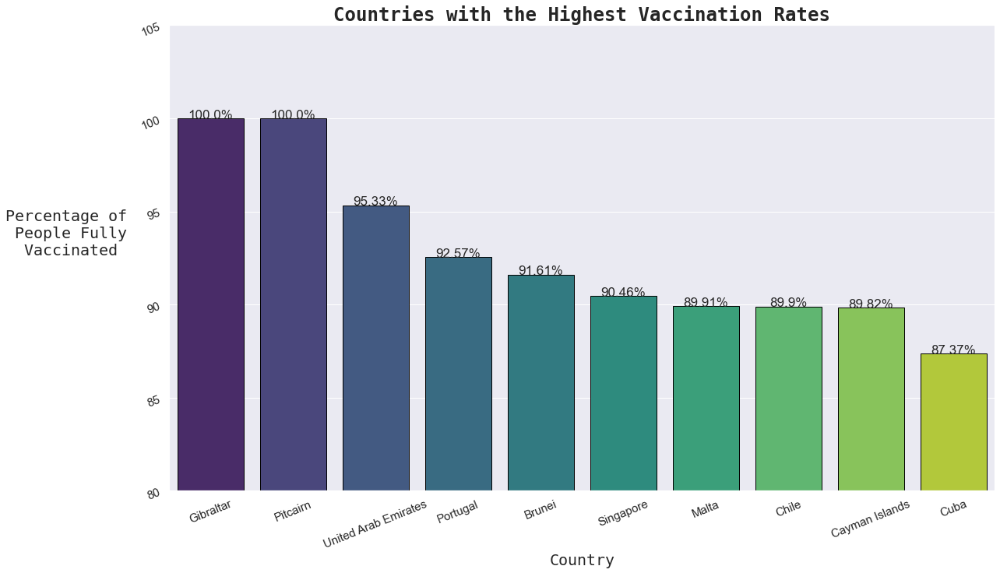

In [18]:
# 10 MOST
plt.figure(figsize=(19,11))
x = country_fully_vaxxed['Country'][0:10]
y = country_fully_vaxxed['Percentage Fully Vaccinated'][0:10]
sns.barplot(x, y, palette='viridis', edgecolor='black')
plt.title('Countries with the Highest Vaccination Rates', font='monospace', fontsize=24, fontweight='bold')
plt.xlabel('Country', font='monospace', fontsize=20)
plt.ylabel('Percentage of \nPeople Fully \nVaccinated  ', font='monospace', fontsize=20, rotation='horizontal', ha='right')
plt.xticks(rotation=22, fontsize=15)
plt.yticks(rotation=22, fontsize=15)
plt.ylim(80,105)
for i in range(0,10):
    plt.text(i,y[i],str(y[i]) + "%",ha='center',fontsize=17)
plt.show()

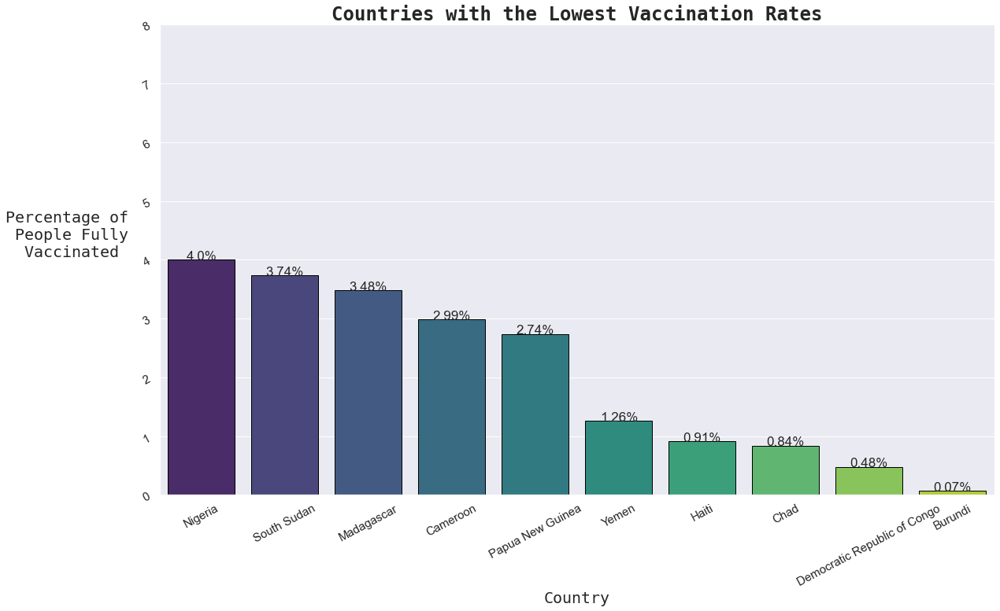

In [19]:
# 10 LEAST
plt.figure(figsize=(19,11))
x = country_fully_vaxxed['Country'].tail(10)
y = country_fully_vaxxed['Percentage Fully Vaccinated'].tail(10)
sns.barplot(x, y, palette='viridis', edgecolor='black')
plt.title('Countries with the Lowest Vaccination Rates', font='monospace', fontsize=24, fontweight='bold')
plt.xlabel('Country', font='monospace', fontsize=20)
plt.ylabel('Percentage of \nPeople Fully \nVaccinated  ', font='monospace', fontsize=20, rotation='horizontal', ha='right')
plt.xticks(rotation=28, fontsize=15)
plt.yticks(rotation=28, fontsize=15)
plt.ylim(0,8)
y.new = list(y)
for i in range(0,10):
    plt.text(i,y.new[i],str(y.new[i]) + "%",ha='center',fontsize=17)
sns.set()
plt.show()

The disparities between the countries with the highest vaccination rates versus those with the lowest could be due to their economic statuses (this will be explored later in this analysis). It could also be due to vaccine hesitancy and ideologies, which differ by country and region. 

### Comparisons between 'fully' vs. 'partially' vaccinated

In [20]:
vaxx_full = []
for i in covid_data['country'].unique():
    vaxx_full.append(covid_data[covid_data['country'] == i]['people_fully_vaccinated_per_hundred'].max())

vaxx_partially = []
for i in covid_data['country'].unique():
    vaxx_partially.append(covid_data[covid_data['country'] == i]['people_vaccinated_per_hundred'].max())
    
vaxx_compare = pd.DataFrame(vaxx_full,vaxx_partially)
vaxx_compare['Country'] = covid_data['country'].unique()
vaxx_compare.reset_index(inplace=True)
vaxx_compare.rename(columns={'index':'Partially', 0:'Fully'}, inplace=True)

vaxx_compare.sort_values(['Partially'], ascending=False, inplace=True)
vaxx_compare.reset_index(inplace=True)
del vaxx_compare['index']

vaxx_compare.loc[0,'Partially'] = 100.00
vaxx_compare.loc[0,'Fully'] = 100.00

vaxx_compare = vaxx_compare.drop(vaxx_compare.index[222])

In [21]:
# Final dataframe
vaxx_compare

,Partially,Fully,Country
0,100.00,100.00,Gibraltar
1,100.00,100.00,Pitcairn
2,98.99,95.33,United Arab Emirates
3,95.02,92.57,Portugal
4,93.78,87.37,Cuba
...,...,...,...
217,3.41,2.74,Papua New Guinea
218,2.05,1.26,Yemen
219,1.60,0.84,Chad
220,1.35,0.91,Haiti


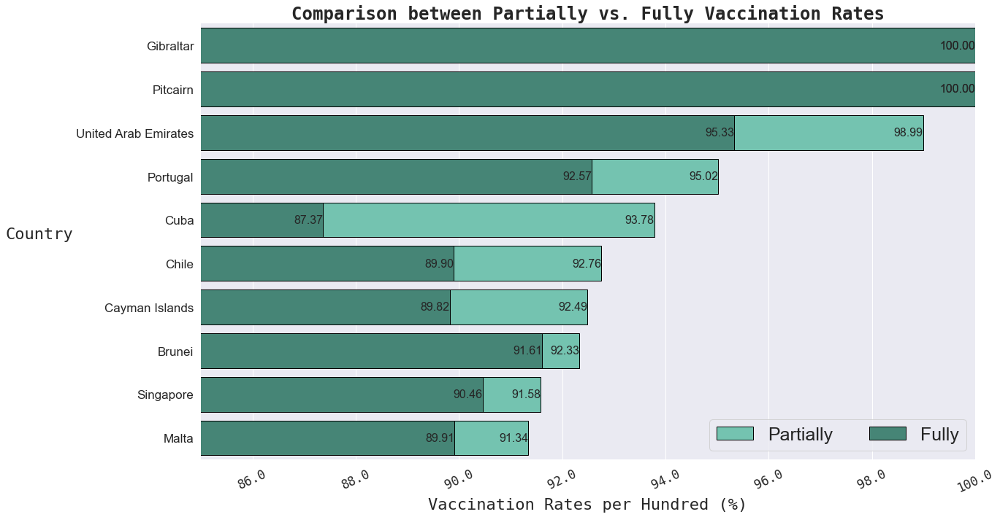

In [22]:
# 10 highest partial vaccination rates (along with full vaccination rates)
f, ax = plt.subplots(figsize = (19,11))
sns.set_color_codes('pastel')
sns.barplot(x = 'Partially', y = 'Country', data = vaxx_compare[0:10],
            label = 'Partially', color='#67D0B7', edgecolor = 'black')
sns.set_color_codes('deep')
sns.barplot(x = 'Fully', y = 'Country', data = vaxx_compare[0:10],
            label = 'Fully', color = '#3B907C', edgecolor = 'black')
ax.legend(ncol=2, loc = 'lower right')
sns.despine(left = True, bottom = True)


for p in ax.patches:
    ax.annotate("%.2f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(0, 0),textcoords='offset points', ha="right", va="center", fontsize=16)

    
ax.legend(ncol=2, loc='lower right', frameon=True, fontsize=25)
ax.set(xlim=(85,100))
ax.set_xlabel("Vaccination Rates per Hundred (%)", font='monospace', fontsize=22)
ax.set_ylabel("Country",font='monospace',fontsize=22,rotation="horizontal",ha='right')
ax.set_xticklabels(ax.get_xticks(),rotation=25,font='monospace',fontsize=17)
ax.tick_params(axis='y',labelsize=17)
ax.set_title("Comparison between Partially vs. Fully Vaccination Rates", font='monospace',fontsize=24,fontweight='bold')

sns.despine(left=True,bottom=True)


plt.show()

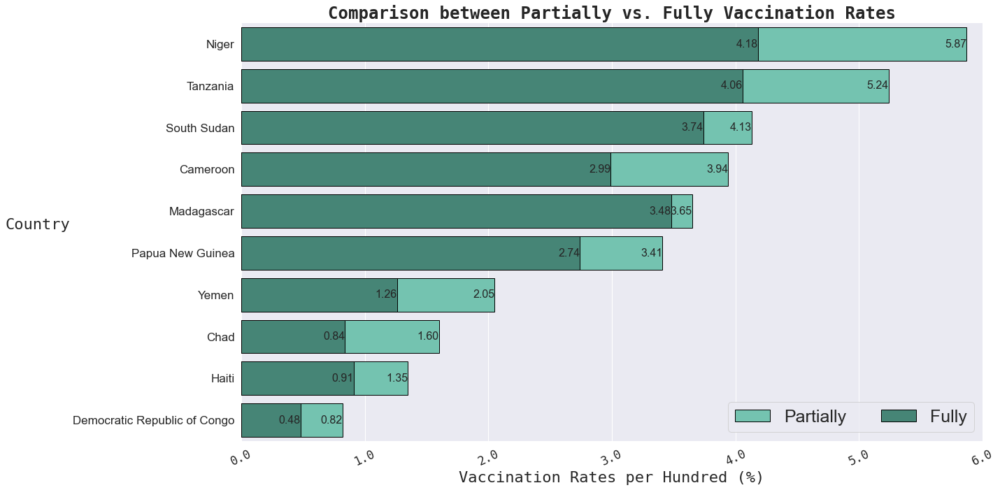

In [23]:
# 10 lowest partial vaccination rates (along with full vaccination rates)
f, ax = plt.subplots(figsize = (19,11))
sns.set_color_codes('pastel')
sns.barplot(x = 'Partially', y = 'Country', data = vaxx_compare.tail(10),
            label = 'Partially', color='#67D0B7', edgecolor = 'black')
sns.set_color_codes('deep')
sns.barplot(x = 'Fully', y = 'Country', data = vaxx_compare.tail(10),
            label = 'Fully', color = '#3B907C', edgecolor = 'black')
ax.legend(ncol=2, loc = 'lower right')
sns.despine(left = True, bottom = True)


for p in ax.patches:
    ax.annotate("%.2f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(0, 0),textcoords='offset points', ha="right", va="center", fontsize=16)

    
ax.legend(ncol=2, loc='lower right', frameon=True, fontsize=25)
ax.set(xlim=(0,6))
ax.set_xlabel("Vaccination Rates per Hundred (%)", font='monospace', fontsize=22)
ax.set_ylabel("Country",font='monospace',fontsize=22,rotation="horizontal",ha='right')
ax.set_xticklabels(ax.get_xticks(),rotation=25,font='monospace',fontsize=17)
ax.tick_params(axis='y',labelsize=17)
ax.set_title("Comparison between Partially vs. Fully Vaccination Rates", font='monospace',fontsize=24,fontweight='bold')

sns.despine(left=True,bottom=True)


plt.show()

Most of the countries listed above fall within a range of +-2% between fully vs. partially vaccinated. One notable exception is Cuba, which has a partial vaccination rate of 93.78%, and a full vaccination rate of 87.37%, as of March 2022. This is a difference of 6.41%.

### What are the daily vaccinations worldwide since late 2020?

In [24]:
# Norway has the earliest date and all dates in between until March 6th, 2022, so we'll use it as a baseline
norway_covid = covid_data[covid_data['country']=='Norway']

worldwide_vaxx = []

for i in norway_covid['date']:
    k=-1
    a=[]
    for j in covid_data['date']:
        k=k+1
        if (i == j):
            a.append(covid_data['daily_vaccinations'][k])
    worldwide_vaxx.append(sum(a)) # appending cumulative vaccinations worldwide each day

In [25]:
dates = []
for i in norway_covid['date']:
    dates.append(i)
    
my_data = {'Date':dates, 'Daily Vaccinations':worldwide_vaxx}
daily_vaxx = pd.DataFrame(my_data)

daily_vaxx['Date'] = pd.to_datetime(daily_vaxx['Date'])  # converting to datetime

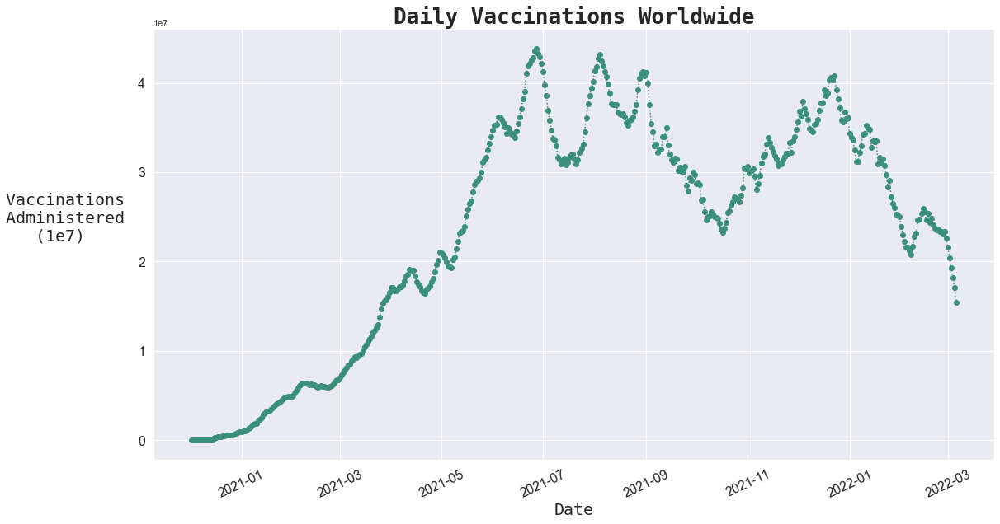

In [26]:
# Creating the timeseries plot of daily vaccinations worldwide
plt.figure(figsize=(17,9))
plt.plot_date(x = daily_vaxx['Date'], y = daily_vaxx['Daily Vaccinations'], linestyle='dotted', color='#3B907C')
plt.xlabel('Date', font='monospace',fontsize=20)
plt.ylabel('Vaccinations \nAdministered \n(1e7)     ', font='monospace',fontsize=20, rotation='horizontal', ha='right')
plt.xticks(rotation=25, fontsize=16)
plt.yticks(fontsize=16)
plt.title('Daily Vaccinations Worldwide', font='monospace', fontsize=26, fontweight='bold')
plt.tight_layout()
plt.show()

The uptick in vaccination rates since early 2021 until around July of 2021 is consistent with the time period when countries and people of different age groups had access to the vaccine. The steep decline thereafter could be due to the majority of people who already planned to get the vaccine having already got it, and vaccine hesitency increasing. Another notable uptick demonstrated in this graph occurs around late October until late December. This time period is consistent with the sudden emergence of the Omicron variant. A surge in those who hadn't already been vaccinated yet might have been the cause for this. Thereafter, another sharp decline in vaccination rates ensued. The third booster adds another intriguing layer, but more data and time is required to assess long terms vaccination rates.  

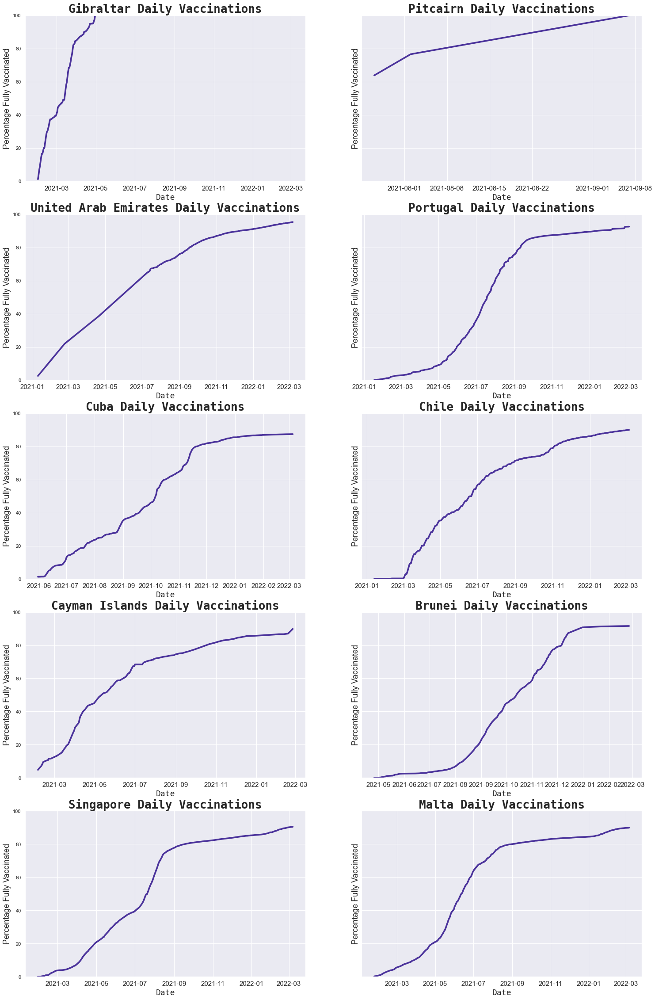

In [27]:
# Daily vaccinations of top 10 countries most vaccinated (fully)
countries = ['Gibraltar','Pitcairn', 'United Arab Emirates', 'Portugal', 'Cuba', 'Chile', 'Cayman Islands', 'Brunei', 'Singapore', 'Malta']

f, (ax) = plt.subplots(5,2,sharey=True,figsize=(25,40))
ax = ax.flatten()
for i in range(0,10):
    x = covid_data[(covid_data['country']==countries[i]) & (covid_data['people_fully_vaccinated_per_hundred'] != 0)][['people_fully_vaccinated_per_hundred','date']]['date']
    y = covid_data[(covid_data['country']==countries[i]) & (covid_data['people_fully_vaccinated_per_hundred'] != 0)][['people_fully_vaccinated_per_hundred','date']]['people_fully_vaccinated_per_hundred']
    ax[i].plot(x,y, color='#4B339B', linewidth=3.7)
    ax[i].set(ylim=(0,100))
    ax[i].set_xlabel('Date', font='monospace', fontsize=18)
    ax[i].set_ylabel('Percentage Fully Vaccinated', fontsize=18)
    ax[i].tick_params(axis='x',labelsize=15)
    ax[i].set_title(countries[i] + ' Daily Vaccinations', font='monospace', fontsize=26, fontweight="bold")

A consistency with all of these graphs representing the timeline of when people were fully vaccinated is that the countries reached a vaccination rate upwards of about 70% before plateauing slightly. Different contries got access to the vaccine at different times, which explains why the increase in vaccination rates occurred at different points.

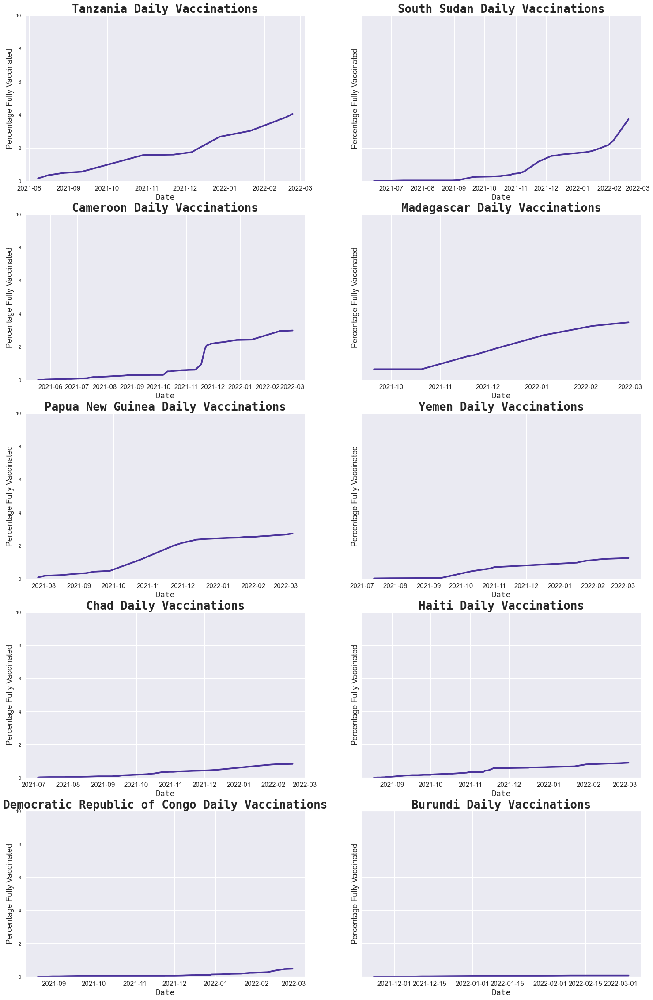

In [28]:
# Daily vaccinations of top 10 countries least vaccinated (fully)
countries = ['Tanzania','South Sudan','Cameroon','Madagascar','Papua New Guinea','Yemen','Chad','Haiti','Democratic Republic of Congo','Burundi']

f, (ax) = plt.subplots(5,2,sharey=True,figsize=(25,40))
ax = ax.flatten()
for i in range(0,10):
    x = covid_data[(covid_data['country']==countries[i]) & (covid_data['people_fully_vaccinated_per_hundred'] != 0)][['people_fully_vaccinated_per_hundred','date']]['date']
    y = covid_data[(covid_data['country']==countries[i]) & (covid_data['people_fully_vaccinated_per_hundred'] != 0)][['people_fully_vaccinated_per_hundred','date']]['people_fully_vaccinated_per_hundred']
    ax[i].plot(x,y, color='#4B339B', linewidth=3.7)
    ax[i].set(ylim=(0,10))
    ax[i].set_xlabel('Date', font='monospace', fontsize=18)
    ax[i].set_ylabel('Percentage Fully Vaccinated', fontsize=18)
    ax[i].tick_params(axis='x',labelsize=15)
    ax[i].set_title(countries[i] + ' Daily Vaccinations', font='monospace', fontsize=26, fontweight="bold")

These graphs representing the timeline for the countries with the lowest vaccination rates mostly show no sudden upticks in vaccination rates. One interesting exception is Cameroon, in which vaccination rates increased from <1% to >2% within a month. 

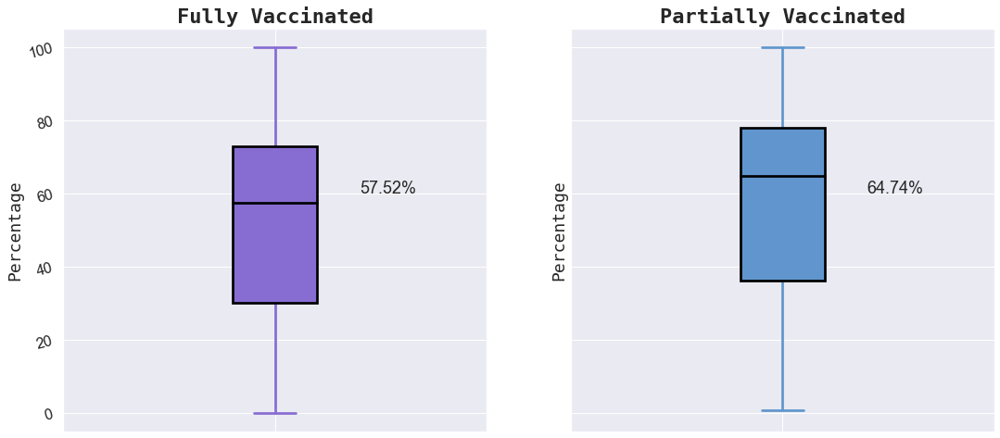

In [29]:
# Creating boxplot for vaccination rate distributions
status = ['Fully','Partially']
medians = ["57.52", "64.74"]
my_colors = ['#876CD2','#6096CD']
final_colors = dict(whiskers='red')

f, (ax) = plt.subplots(1,2,sharey=True,figsize=(18,8))
ax = ax.flatten()
for i in range(0,2):
    ax[i].boxplot(vaxx_compare[status[i]],patch_artist=True, widths=0.2, boxprops=dict(facecolor=my_colors[i], linewidth=2.7), whiskerprops=dict(color=my_colors[i],linewidth=2.7), medianprops=dict(color='black', linewidth=2.7), capprops=dict(color=my_colors[i], linewidth=2.7))
    ax[i].set_title(status[i] + " Vaccinated", font='monospace', fontsize=22, fontweight="bold")
    ax[i].set_ylabel('Percentage', font='monospace', fontsize=18)
    ax[i].set(xticklabels=[])
    ax[i].tick_params(axis='y', labelsize=16, rotation=15)
    ax[i].text(1.2,60,medians[i]+"%", size=18)
    
    
plt.show()

These box and whisker plots show the minimum, maximum, median, second and third quartiles of the data between those fully and partially vaccinated again COVID-19. As expected, the median for those partially vaccinated is higher. This is due to people getting only their first dose (Pfizer & Moderna) and not returning fo the second dose. We can see in both plots from the 3rd quartile that 75% of the vaccination statuses fall below 80%. 

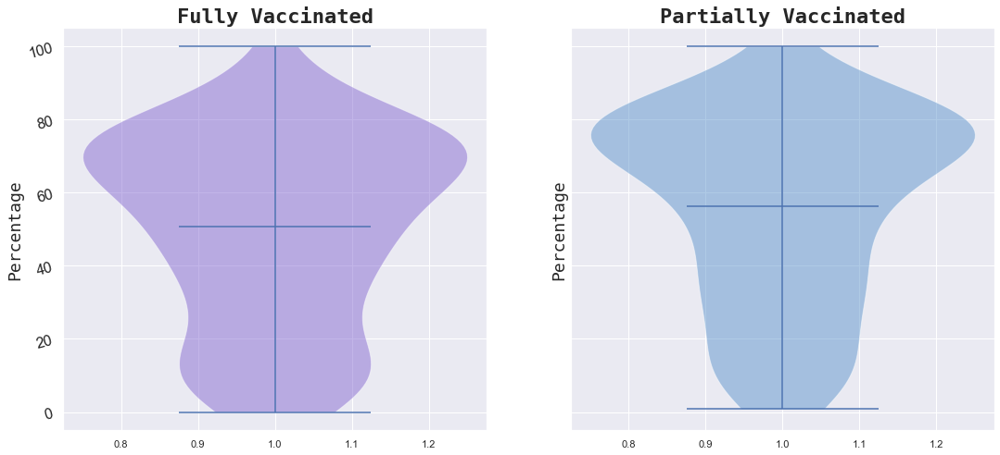

In [30]:
# Creating violinplot for vaccination rate distributions
status = ['Fully','Partially']
my_colors = ['#876CD2','#6096CD']
final_colors = dict(whiskers='red')

f, (ax) = plt.subplots(1,2,sharey=True,figsize=(18,8))
ax = ax.flatten()
for i in range(0,2):
    parts = ax[i].violinplot(vaxx_compare[status[i]], showmeans=True)
    for pc in parts['bodies']:
        pc.set_facecolor(my_colors[i])
        pc.set_alpha(0.5)
    ax[i].set_title(status[i] + " Vaccinated", font='monospace', fontsize=22, fontweight='bold')
    ax[i].set_ylabel('Percentage', font='monospace', fontsize=18)
    ax[i].tick_params(axis='y', labelsize=16, rotation=15)
    
plt.show()

These violin plots show a summary and distribution of the vaccination statuses across the world from the countries represented in the dataset. We can see the plot widen between 60-80% vaccination rate, which demonstrates a higher probability of a country falling in that range, due to the higher frequency.

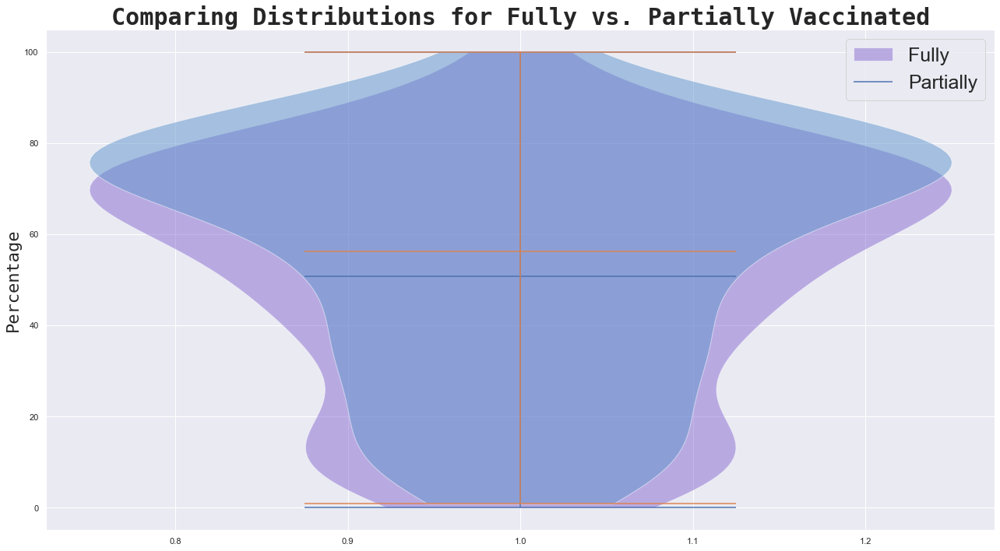

In [31]:
# Creating overlapping violinplot for vaccination rate distributions
fig, ax = plt.subplots(figsize=(18,10))

v1 = ax.violinplot(vaxx_compare['Fully'], showmeans=True)
v2 = ax.violinplot(vaxx_compare['Partially'], showmeans=True)
labels=['Fully','Partially']
for pc in v1['bodies']:
    pc.set_facecolor('#876CD2')
    pc.set_alpha(0.5)
for pc in v2['bodies']:
    pc.set_facecolor('#6096CD')
    pc.set_alpha(0.5)
ax.set_ylabel('Percentage', font='monospace',fontsize=22)
ax.set_title('Comparing Distributions for Fully vs. Partially Vaccinated', font='monospace',fontsize=30, fontweight='bold')
ax.legend(labels=labels, fontsize=25)

fig.tight_layout()

These overlapping violin plots demonstarte the differences between partial vs. full vaccination rates globally. We can see that there is a greater frequency of countries with partial vaccination rates >70-75%, whereas for full vaccination rates, that frequency increase falls closer to 70%. 

### Which vaccine type is used in each country?

In [32]:
# covid_data2['location'].nunique() , there are only 42 diff locations/countries in dataset
covid_data2.dropna(inplace=True)

# This gives us cumulative vaccines administered per type, per country, as of early March 2022
total_vaccines = []
for i in covid_data2['location'].unique():
    total_vaccines.append(covid_data2[covid_data2['location']==i].groupby(['vaccine'])['total_vaccinations'].max())
    
vaxx_type_by_country = pd.DataFrame(total_vaccines)
vaxx_type_by_country.reset_index(inplace=True)
del vaxx_type_by_country['index']
country_col = covid_data2['location'].unique()
vaxx_type_by_country.insert(loc=0, column='Country', value=country_col)
vaxx_type_by_country.fillna(0,inplace=True)

vaxx_type_by_country

,Country,Johnson&Johnson,Moderna,Novavax,Oxford/AstraZeneca,Pfizer/BioNTech,CanSino,Sinovac,Sinopharm/Beijing,Sputnik V,Covaxin
0,Austria,363061.0,1582128.0,1758.0,1587742.0,14520577.0,0.0,0.0,0.0,0.0,0.0
1,Belgium,425123.0,4260241.0,2.0,2846397.0,17351372.0,0.0,0.0,0.0,0.0,0.0
2,Bulgaria,509115.0,487978.0,0.0,478540.0,2821950.0,0.0,0.0,0.0,0.0,0.0
3,Chile,0.0,0.0,0.0,549178.0,7874784.0,574301.0,25497638.0,0.0,0.0,0.0
4,Croatia,200526.0,507420.0,0.0,567787.0,3908849.0,0.0,0.0,0.0,0.0,0.0
5,Cyprus,29691.0,183190.0,0.0,254524.0,1176311.0,0.0,0.0,0.0,0.0,0.0
6,Czechia,412342.0,1576689.0,393.0,886969.0,14541977.0,0.0,0.0,0.0,0.0,0.0
7,Denmark,47061.0,1700116.0,0.0,155568.0,10243604.0,0.0,0.0,0.0,0.0,0.0
8,Ecuador,0.0,0.0,0.0,5009163.0,8552679.0,536882.0,15812935.0,0.0,0.0,0.0
9,Estonia,77640.0,230084.0,0.0,237667.0,1476976.0,0.0,0.0,0.0,0.0,0.0


In [52]:
import plotly.offline as pyo
import plotly.graph_objs as go
import plotly as py
py.offline.init_notebook_mode(connected = True)
# First set of countries represented in dataset, vaccine types
fig = px.bar(vaxx_type_by_country[0:20], x='Country', y=['Pfizer/BioNTech', 'Oxford/AstraZeneca', 'Moderna', 'Johnson&Johnson'], color_discrete_map={'Pfizer/BioNTech':'#3B907C','Oxford/AstraZeneca':'#6096CD','Moderna':'#876CD2','Johnson&Johnson':'#79BD5B'}, title='Vaccine Type per Country')
fig.update_layout(width=1000,height=700,bargap=0.30, font=dict(family='monospace',size=12), yaxis_title='Vaccinations Administered', title=dict(x=0.45,y=0.90), legend_borderwidth=2.2, legend_font_size=12, legend_title_text='Vaccine Type')
fig = go.Figure(data=fig)
fig.show(renderer='notebook')

In [53]:
pyo.init_notebook_mode()
py.offline.init_notebook_mode(connected = True)
# Second set of countries represented in dataset, vaccine types
fig = px.bar(vaxx_type_by_country[20:], x='Country', y=['Pfizer/BioNTech', 'Oxford/AstraZeneca', 'Moderna', 'Johnson&Johnson'], color_discrete_map={'Pfizer/BioNTech':'#3B907C','Oxford/AstraZeneca':'#6096CD','Moderna':'#876CD2','Johnson&Johnson':'#79BD5B'}, title='Vaccine Type per Country')
fig.update_layout(width=1000,height=700,bargap=0.30, font=dict(family='monospace',size=11), yaxis_title='Vaccinations Administered', title=dict(x=0.45,y=0.90), legend_borderwidth=2.2, legend_font_size=12, legend_title_text='Vaccine Type')
fig = go.Figure(data=fig)
fig.show(renderer='notebook')

For the 42 countries represented in the second dataset (including information on vaccine types), we can see that the Pfizer vaccine is the most common, with the majority of countries administering it as their primary type. This is followed by the Moderna vaccine. Other notable vaccine types are the Johnson & Johnson vaccine, as well as the Oxford/AstraZeneca vaccine. The Oxford vaccine is not yet authorized for use in the United States, but other regions have already administered a fair number of doses, such as Italy, Germany and France.

In [35]:
# Creating a DataFrame with vaccine type data
# This gets sum of all doses for each vaccine type from all countries in the data
# Note, our info is limited to the countries with the actual information; only 42 of them
total_doses = []

for i in vaxx_type_by_country.columns[1:]:
    total_doses.append(vaxx_type_by_country[i].sum())
    
sum_vaccine_type = pd.DataFrame(total_doses,vaxx_type_by_country.columns[1:])
sum_vaccine_type.reset_index(inplace=True)
sum_vaccine_type.rename({'index':'Vaccine Type',0:'Count'},axis=1,inplace=True)

In [36]:
total = sum(sum_vaccine_type['Count'])

for i in range(0,len(sum_vaccine_type)):
    print("Percentage of", sum_vaccine_type['Vaccine Type'][i], "doses: ", "{0:.2%}".format((sum_vaccine_type['Count'][i]) / total))

Percentage of Johnson&Johnson doses:  2.52%
Percentage of Moderna doses:  20.26%
Percentage of Novavax doses:  0.01%
Percentage of Oxford/AstraZeneca doses:  6.65%
Percentage of Pfizer/BioNTech doses:  66.54%
Percentage of CanSino doses:  0.04%
Percentage of Sinovac doses:  2.21%
Percentage of Sinopharm/Beijing doses:  1.63%
Percentage of Sputnik V doses:  0.14%
Percentage of Covaxin doses:  0.00%


### What are the vaccine rates for countries of different income statuses?

In [37]:
vaxx_compare2 = vaxx_compare.copy()
vaxx_compare2['fully_percentage'] = vaxx_compare2['Fully'] / 100
vaxx_compare2['not_fully_percentage'] = 1 - vaxx_compare2['fully_percentage']
vaxx_compare2.head()

,Partially,Fully,Country,fully_percentage,not_fully_percentage
0,100.00,100.00,Gibraltar,1.0000,0.0000
1,100.00,100.00,Pitcairn,1.0000,0.0000
2,98.99,95.33,United Arab Emirates,0.9533,0.0467
3,95.02,92.57,Portugal,0.9257,0.0743
4,93.78,87.37,Cuba,0.8737,0.1263


Gathering data from World Bank:
https://datatopics.worldbank.org/world-development-indicators/the-world-by-income-and-region.html

Choosing 3 countries randomly from each category: low income, lower middle income, upper middle income, high income

Low Income: South Sudan, Mali, Chad

Lower Middle Income: Philippines, Tajikistan, Nepal

Upper Middle Income: Peru, Romania, Iraq

High Income: Australia, Belgium, Chile

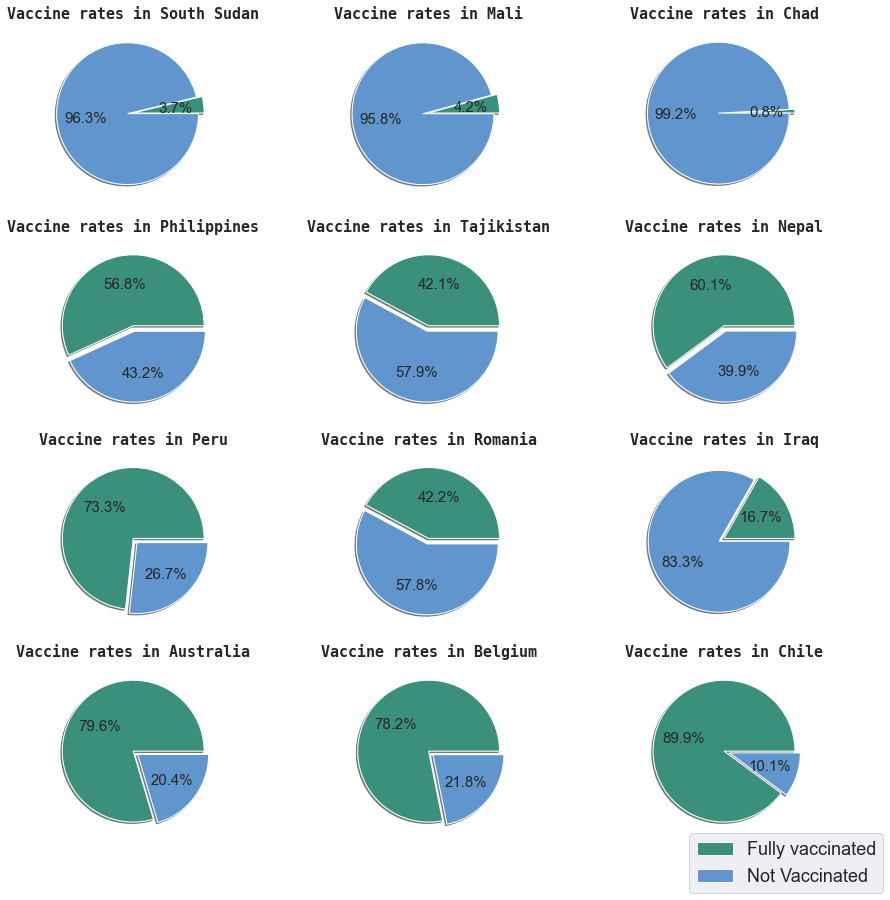

In [38]:
fig, (ax) = plt.subplots(4,3,figsize=(15,15), sharey=True)
ax = ax.flatten()

q = [214,211,219,140,142,80,28,152,186,15,49,5]
p = 0

for i in q:
    y = np.array([vaxx_compare2['fully_percentage'][i], vaxx_compare2['not_fully_percentage'][i]])
    my_labels = ["Fully vaccinated", "Not Vaccinated"]
    my_explode = [0, 0.08]
    colors = ['#3B907C','#6096CD']
    ax[p].pie(y, explode=my_explode, colors=colors, autopct = '%1.1f%%', shadow=True, textprops={'fontsize':15})
    ax[p].set_title("Vaccine rates in " + vaxx_compare2.iloc[q[p]]['Country'], font='monospace', fontsize=15, fontweight='bold')
    p += 1
    
ax[11].legend(labels=my_labels,bbox_to_anchor=(1.45,-0.35),loc='lower right', fontsize=18)

From the pie charts displayed above (with each row representing countries from a different
income level), we can already see a trend with vaccination rates on each level. The three countries,
South Sudan, Mali and Chad in the category of 'low income,' have vaccination rates <5%, whereas the countries,
Australia, Belgium, and Chile ('high income') have vaccination rates >75%. The countries
for the other two categories ('lower middle income', 'upper middle income') vary in terms
of vaccination rates. It's worth noting this was only a sample of countries and their
vaccination rates, so general conclusions on topics such as vaccine hesitancy or accesibility
to vaccines cannot be made until further analysis.

# Conclusion

Overall, the datasets presented in this analysis have offerred great insight on vaccination rates across the globe. The varied vaccination statuses between countries continue to spike even more questions on the 'why' for the disparities. Income status? Vaccine hesitancy? There are many factors that can contribute to such differences in vaccination rates, and only over time (years passed), will we begin to see the picture in full light. The exploration of datasets such as these is important to garner more questions and insights that will help solidify our understanding of the COVID-19 vaccines and their rates (partially and fully) across different countries.  

# References

COVID-19 vaccines: Get the facts, (2022). Mayo Clinic. Retrieved from https://www.mayoclinic.org/diseases-conditions/coronavirus/in-depth/coronavirus-vaccine/art-20484859

Current World Population, (2022). Worldometer. Retrieved from https://www.worldometers.info/world-population/#:~:text=The%20current%20world%20population%20is,currently%20living

The World by Income and Region, (2022). The World Bank. Retrieved from https://datatopics.worldbank.org/world-development-indicators/the-world-by-income-and-region.html

What is Coronavirus, (2022). Johns Hopkins Medicine. Retrieved from https://www.hopkinsmedicine.org/health/conditions-and-diseases/coronavirus